# DL TERM PROJECT PART-A

In [1]:
import os
import pandas as pd
import spacy              # for tokenisation
import torch
from torch.nn.utils.rnn import pad_sequence       #pad batch
from torch.utils.data import DataLoader, Dataset
from PIL import Image      #load image
import torchvision.transforms as transforms
import torch.nn as nn
import torchvision.models as models
import torch.optim as optim
from torch.utils.tensorboard import SummaryWriter
import matplotlib.pyplot as plt

2024-04-14 12:58:39.936858: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-04-14 12:58:39.936963: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-04-14 12:58:40.181077: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered


In [2]:
spacy_eng = spacy.load("en_core_web_sm")

### Vocabulary

In [3]:
class Vocabulary:
    def __init__(self, freq_threshold):
        self.itos = {0:"<PAD>", 1 : "<SOS>", 2 : "<EOS>", 3 : "<UNK>"}
        self.stoi = {"<PAD>" : 0, "<SOS>" : 1, "<EOS>" : 2, "<UNK>":3}
        self.freq_threshold = freq_threshold
        
    def __len__(self):
        return len(self.itos)
    
    #Tokenize using spacy
    @staticmethod
    def tokenizer_eng(text):
        return [tok.text.lower() for tok in spacy_eng.tokenizer(text)]
        #tokenize based on spaces
    
    def build_vocabulary(self, sentence_list):
        frequencies = {}
        
        idx = 4
        for sentence in sentence_list:
            for word in self.tokenizer_eng(sentence):
                if word not in frequencies:
                    frequencies[word] = 1
                else:
                    frequencies[word] += 1
                    
                if frequencies[word] == self.freq_threshold:
                    self.stoi[word] = idx
                    self.itos[idx] = word
                    idx+=1
    
    def numericalize(self, text):
        tokenized_text = self.tokenizer_eng(text)
        
        #Numericalize a text
        # for every token in tokenized text if it is present in stoi dictionary return else return "<UNK>"
        return [
            self.stoi[token] if token in self.stoi else self.stoi["<UNK>"]
            for token in tokenized_text
        ]
        
    

### Importing Data

In [4]:
class ImageDataset(Dataset):
    
    def __init__(self, root_dir, captions_file, transform = None, freq_threshold = 2):
        self.root_dir = root_dir
        self.df = pd.read_csv(captions_file)
        self.transform = transform
        
        
        self.imgs = self.df["filename"]
        self.captions = self.df["caption"]
        
        #Init vocab
        self.vocab = Vocabulary(freq_threshold)
        self.vocab.build_vocabulary(self.captions.tolist())
        
    def __len__(self):
        return len(self.df)
    
    def __getitem__(self, index):
        caption = self.captions[index]
        img_id = self.imgs[index]
        img = Image.open(os.path.join(self.root_dir, img_id)).convert("RGB")
        
#         print(img_id)
#         print(caption)
        
        if self.transform is not None:
            img = self.transform(img)
            
        numericalized_caption = [self.vocab.stoi["<SOS>"]]
        numericalized_caption += self.vocab.numericalize(caption)
        numericalized_caption.append(self.vocab.stoi["<EOS>"])
        
        return img, torch.tensor(numericalized_caption)
        
        
        
        

In [5]:
class MyCollate:
    
    def __init__(self, pad_idx):
        self.pad_idx = pad_idx
        
    def __call__(self, batch):
        imgs = [item[0].unsqueeze(0) for item in batch]
        imgs = torch.cat(imgs, dim = 0)
        targets = [item[1] for item in batch]
        targets = pad_sequence(targets, batch_first =False, padding_value = self.pad_idx)
        
        return imgs, targets

In [6]:
def get_loader(root_folder, annotation_file, transform, shuffle = True, batch_size = 8, num_workers = 2, pin_mem = True):
    
    dataset = ImageDataset(root_folder, annotation_file, transform = transform)
    pad_idx = dataset.vocab.stoi["<PAD>"]
    
    loader = DataLoader(dataset = dataset, batch_size = batch_size, num_workers = num_workers, shuffle = shuffle, pin_memory = pin_mem, collate_fn = MyCollate(pad_idx = pad_idx), )
    
    return loader, dataset

In [7]:
transform = transforms.Compose(
        [
            transforms.Resize((299, 299)),
            transforms.ToTensor(),
            transforms.Normalize((0.485, 0.456, 0.406), (0.229, 0.224, 0.225)),
        ]
    )

train_dataloader, train_dataset = get_loader("/kaggle/input/image-captioning/custom_captions_dataset/train", annotation_file = "/kaggle/input/image-captioning/custom_captions_dataset/train.csv", transform = transform)
valid_dataloader, valid_dataset = get_loader("/kaggle/input/image-captioning/custom_captions_dataset/val", annotation_file = "/kaggle/input/image-captioning/custom_captions_dataset/val.csv", transform = transform)
test_dataloader, test_dataset = get_loader("/kaggle/input/image-captioning/custom_captions_dataset/test", annotation_file = "/kaggle/input/image-captioning/custom_captions_dataset/test.csv", transform = transform,shuffle = False, batch_size = 4)

#### Sample image and caption

715


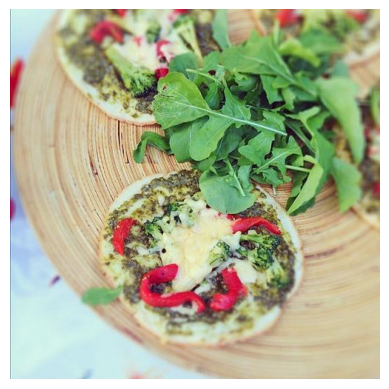

,Unnamed: 0,filename,caption
0,0,train_1.jpg,A white round plate is on a table with a plast...
1,1,train_2.jpg,There are four small pizzas on a brown wooden ...
2,2,train_3.jpg,A black and white cat is sitting in a white ch...
3,3,train_4.jpg,A boy is practicing his skateboard moves outsi...
4,4,train_5.jpg,Two brown horses are standing together outside...


In [8]:
print(len(train_dataloader))

plt.imshow(Image.open(os.path.join("/kaggle/input/image-captioning/custom_captions_dataset/train", train_dataset.df["filename"][1])))
plt.axis('off')
plt.show()

train_dataset.df.head()


### Encoder

In [9]:
class EncoderCNN(nn.Module):
    def __init__(self, embed_size, train_CNN = False):
        
        super(EncoderCNN, self).__init__()
        self.train_CNN = train_CNN
        self.inception = models.inception_v3(weights=models.Inception_V3_Weights.DEFAULT)
        self.inception.fc = nn.Linear(self.inception.fc.in_features, embed_size)
        self.relu = nn.ReLU()
        self.dropout = nn.Dropout(0.4)
        
    def forward(self, images):
        features = self.inception(images)
        if not isinstance(features, torch.Tensor):
            feature_tensor = features.logits
#             print("Feature_tensor:",feature_tensor.shape)
        else:
            feature_tensor = features
#             print("Feature_NON-tensor:",feature_tensor.shape)
        for name, param in self.inception.named_parameters():
            if "fc.weight" in name or "fc.bias" in name:
                param.requires_grad = True
            else:
                param.requires_grad = self.train_CNN
        
        return self.dropout(self.relu(feature_tensor))
    


### Decoder

In [10]:
class DecoderRNN(nn.Module):
    def __init__(self, embed_size, hidden_size, vocab_size, num_layers = 1):
        super(DecoderRNN, self).__init__()
        self.embed = nn.Embedding(vocab_size, embed_size)
        self.lstm = nn.LSTM(embed_size, hidden_size, num_layers)
        self.linear = nn.Linear(hidden_size, vocab_size)
        self.dropout = nn.Dropout(0.4)
        
        
    def forward(self, features, captions):
        embeddings = self.dropout(self.embed(captions))
        embeddings = torch.cat((features.unsqueeze(0), embeddings), dim = 0)
        hiddens, _ = self.lstm(embeddings)
        outputs = self.linear(hiddens)
        
        return outputs
    

# Model Class
    
class CNN_RNN(nn.Module):
    def __init__(self, embed_size, hidden_size, vocab_size, num_layers = 1):
        super(CNN_RNN, self).__init__()
        self.encoderCNN = EncoderCNN(embed_size)
        self.decoderRNN = DecoderRNN(embed_size, hidden_size, vocab_size, num_layers)
        
    def forward(self, images, captions):
        features = self.encoderCNN(images)
        outputs = self.decoderRNN(features, captions)
        return outputs
    
    def captions_image(self, image, vocabulary, max_length=50):
        result_caption = []
        
        with torch.no_grad():
            x = self.encoderCNN(image).unsqueeze(0)

            states = None
            
            for _ in range(max_length):
                hiddens, states = self.decoderRNN.lstm(x, states)
                output = self.decoderRNN.linear(hiddens.squeeze(0))

                predicted = output.argmax(1)
                result_caption.append(predicted.item())
                x = self.decoderRNN.embed(predicted).unsqueeze(0)
#                 x = self.decoderRNN.embed(predicted)
#                 print("New X : ", x.shape)
                if vocabulary.itos[predicted.item()] == "<EOS>":
                    break
        return [vocabulary.itos[idx] for idx in result_caption]
    
                

#### Hyperparameters

In [11]:
embed_size = 512
hidden_size = 512
vocab_size = len(train_dataset.vocab)
print(vocab_size)
num_layers = 1
learning_rate = 3e-4
print(learning_rate)
num_epochs = 100
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = CNN_RNN(embed_size , hidden_size, vocab_size, num_layers).to(device)
print("Total Epochs : ", num_epochs)

4570
0.0003


Downloading: "https://download.pytorch.org/models/inception_v3_google-0cc3c7bd.pth" to /root/.cache/torch/hub/checkpoints/inception_v3_google-0cc3c7bd.pth
100%|██████████| 104M/104M [00:00<00:00, 155MB/s]


Total Epochs :  100


#### Initializing linear layer weights

In [12]:
nn.init.xavier_uniform_(model.decoderRNN.embed.weight)
nn.init.xavier_uniform_(model.decoderRNN.linear.weight)
nn.init.xavier_uniform_(model.encoderCNN.inception.fc.weight)

nn.init.constant_(model.decoderRNN.linear.bias,0)
nn.init.constant_(model.encoderCNN.inception.fc.bias,0)

Parameter containing:
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0., 0.

### Training and Validation

In [13]:
def train(model,learning_rate ,num_epochs,train_loader = train_dataloader, train_dataset = train_dataset,valid_loader = valid_dataloader):
    
    torch.backends.cudnn.benchmark = True
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    load_model = False
    save_model = False
    
    #Hyperparameters
    
    
    #for tensorboard
    writer = SummaryWriter("runs/image_captions")
    step = 0
    
    # initialize loss etc
    criterion = nn.CrossEntropyLoss(ignore_index = train_dataset.vocab.stoi["<PAD>"])
    optimizer = optim.Adam(model.parameters(), lr = learning_rate)
    
    model.train()
    
    for epoch in range(num_epochs):
        print("Epoch: ",epoch)
        if save_model:
            checkpoint = {
                "state_dict" : model.state_dict(),
                "optimizer" : optimizer.state_dict(),
                "step" : step,
                
            }
            torch.save(checkpoint, "/kaggle/working/model")
            
        total_train_loss = 0 
        for idx, (imgs, captions) in enumerate(train_loader):
            imgs = imgs.to(device)
            captions = captions.to(device)
#             print(captions)
#             print(type(imgs))
            outputs = model(imgs, captions[:-1])     #Avoid EOS
#             outputs = model(imgs, captions)     #Avoid EOS

            temp_outputs = outputs.reshape(-1, outputs.shape[2])
            temp_captions = captions.reshape(-1)
            loss = criterion(temp_outputs, temp_captions)
            total_train_loss += loss.item()
            writer.add_scalar("Training loss", loss.item(), global_step = step)
            step += 1
            
            optimizer.zero_grad()
            loss.backward(loss)
            optimizer.step()
            
        # Validation loop
        model.eval()
        total_valid_loss = 0
        with torch.no_grad():
            for idx, (imgs, captions) in enumerate(valid_loader):
                imgs = imgs.to(device)
                captions = captions.to(device)

                outputs = model(imgs, captions[:-1])
                temp_outputs = outputs.reshape(-1, outputs.shape[2])
                temp_captions = captions.reshape(-1)
                loss = criterion(temp_outputs, temp_captions)
                total_valid_loss += loss.item()

        train_loss = total_train_loss / len(train_loader)
        valid_loss = total_valid_loss / len(valid_loader)

        print(f"Training Loss: {train_loss}, Validation Loss: {valid_loss}")

        model.train()
            

In [14]:
train(model, learning_rate, num_epochs)

Epoch:  0
Training Loss: 4.733743757301277, Validation Loss: 7.058993455742588
Epoch:  1
Training Loss: 3.8839838794894987, Validation Loss: 7.805932317461286
Epoch:  2
Training Loss: 3.629430052950666, Validation Loss: 8.15379980632237
Epoch:  3
Training Loss: 3.451067487343208, Validation Loss: 8.386765488055573
Epoch:  4
Training Loss: 3.31370395480336, Validation Loss: 8.549366494186787
Epoch:  5
Training Loss: 3.2061050925221477, Validation Loss: 8.701404315082966
Epoch:  6
Training Loss: 3.114891635454618, Validation Loss: 8.776248210618476
Epoch:  7
Training Loss: 3.0302237570702615, Validation Loss: 8.884945508812656
Epoch:  8
Training Loss: 2.9469401592974895, Validation Loss: 8.900402421710872
Epoch:  9
Training Loss: 2.8764629567419733, Validation Loss: 9.024929062659
Epoch:  10
Training Loss: 2.811821175955392, Validation Loss: 9.110739964397014
Epoch:  11
Training Loss: 2.756002490170352, Validation Loss: 9.170298784720798
Epoch:  12
Training Loss: 2.7011323025176575, Vali

### Testing and Evaluation

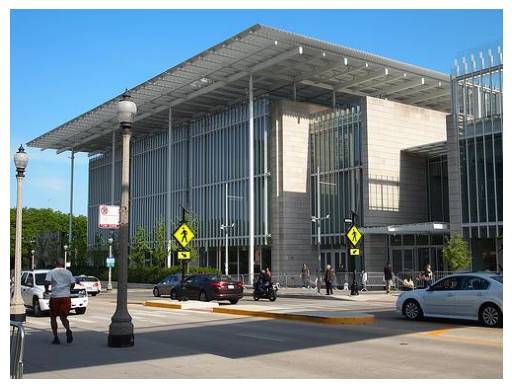

CORRECT :  A large building with bars on the windows in front of it. There is people walking in front of the building. There is a street in front of the building with many cars on it. 
PREDICTED : a large white building sits behind a street . there is a large white building in front of the building . there are people standing in front of the building . <EOS>


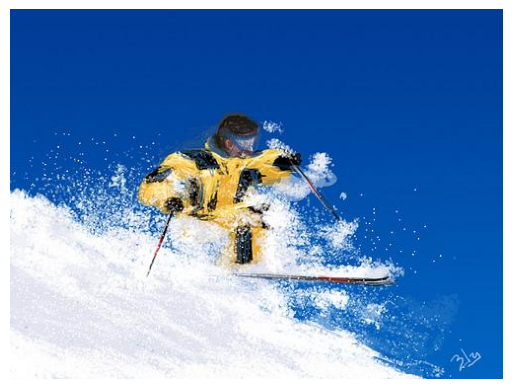

CORRECT :  A person is skiing through the snow. There is loose snow all around them from him jumping. The person is wearing a yellow snow suit. The person is holding two ski poles in their hands. 
PREDICTED : a person is skiing down a hill . the person is wearing a black jacket and pants . she is also wearing black pants . the skis are white and black . <EOS>


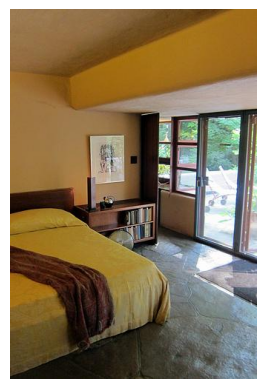

CORRECT :  There is a bed in a room against a wall. There is a brown blanket on top of the bed. There is a small brown book shelf next to the bed. There is a picture hanging on the wall above the shelf. 
PREDICTED : a white bed is in a room . there is a white rug under the bed . there is a white pillow under the bed . <EOS>


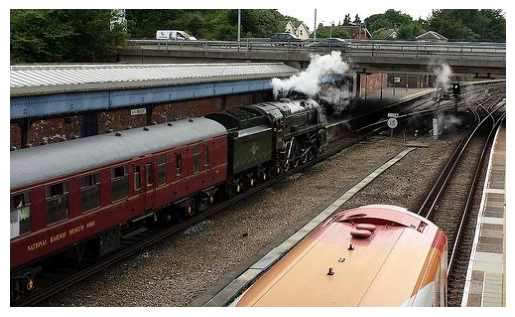

CORRECT :  A black and red train is on the tracks and has steam coming out off of it. There is another train next to the first train that is orange. There is an overpass over the train tracks with cars on it. 
PREDICTED : a train is sitting on the tracks . the train is yellow and black . there is a large white line in the middle of the train . the train is red and black . the train cars are on the left side of the train . the train


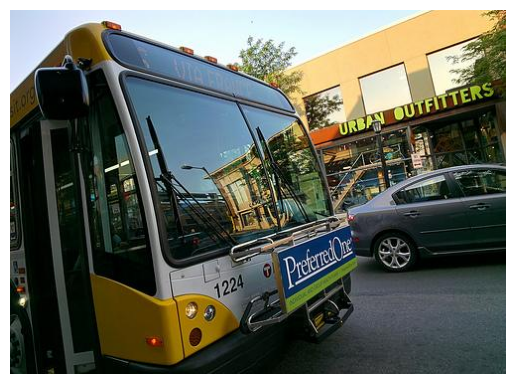

CORRECT :  A white and yellow public transportation bus with "122" on front is stopped with it's doors open. There is a gray car on the street beside the bus. Behind the car there is a  building with an "Urban Outfitters" on the first floor.
PREDICTED : a bus is parked near a bus . the bus is white and has a blue stripe on the side . the bus has yellow doors with black numbers . there is a bulletin board on the side of the bus . <EOS>


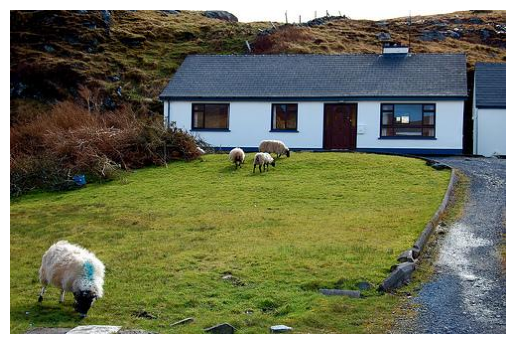

CORRECT :  A large white house with a brown door sits behind some grass. There are four sheep grazing on the grass in front of the house. The house ahs a gray roof. 
PREDICTED : there are two horses in the field . one of the horses is standing on top of a white horse . the horse on the right is a lighter brown color . the horse is wearing a black helmet . <EOS>


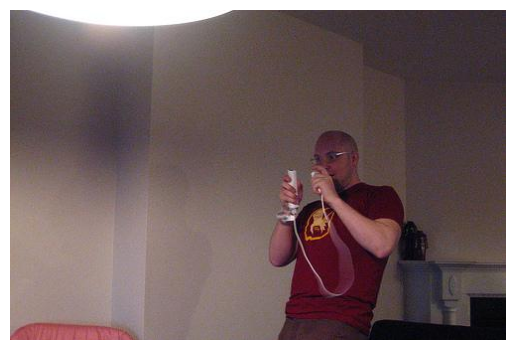

CORRECT :  A man in a red and yellow t-shirt is holding a Wii remote in each of his hands. Behind him there is a fireplace which has been painted white. In front of him a light which is on and illuminating the room. 
PREDICTED : a man is sitting on a couch . the man is wearing a blue shirt . the man is wearing a striped shirt . there is a man in a blue shirt sitting in front of it . there is a large window on the couch . <EOS>


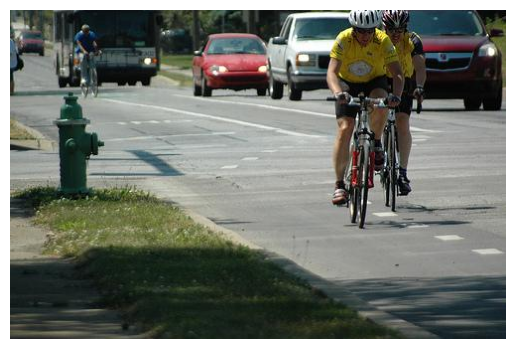

CORRECT :  There are three men riding bicycles. Two of the men are wearing yellow and the third man has a blue shirt. The two men are way ahead of the third man. The men are bicycling in the bicycle lane. The cars are on the left side of the men.
PREDICTED : a man is standing outside of patio doors talking on a phone . he is wearing a blue and black striped shirt , and a gray beard . the man is holding a black umbrella and is wearing black pants . the man is holding a silver camera and


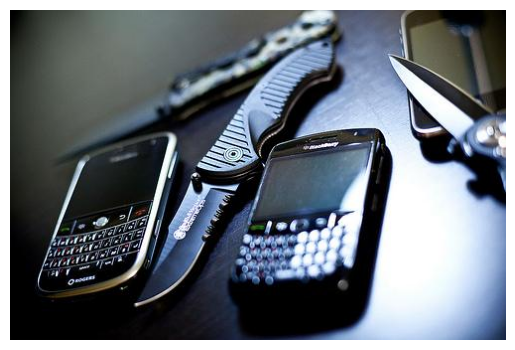

CORRECT :  TWO CELL PHONES ON THE TABLE.THEY BOTH ARE DARK IN COLOR A ND ARE BLACBERRYS.THERE ARE THREE CUTTING KNIVES.ONE KNIFE IS BETWEEN THE TWO PHONES.THERE IS A THIRD PHONE WITH A KNIFE LYING OVER IT.
PREDICTED : a person is holding a cell phone . the cell phone is black . the person is wearing a black shirt . the person has short hair . there is a large window by the building . <EOS>


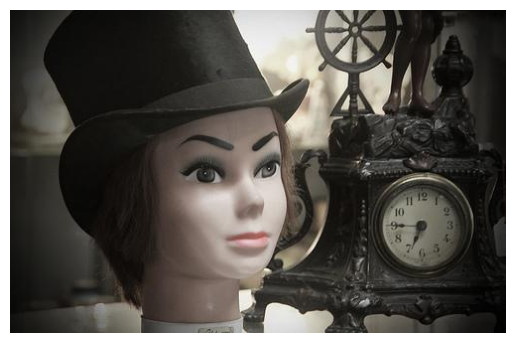

CORRECT :  A painted mannequin head sits on a table. It is a feminine head with arched eyebrows a small nose, big eyes and it is wearing a black top hat and a brown wig. To the right of the head is a metal sculpture clock with a white face.
PREDICTED : a clock is displayed on a gold cylinder . the clock does have a <UNK> face , and the numbers is <UNK> . the clock is very <UNK> . the clock is very shiny and also has a white steeple on it . <EOS>


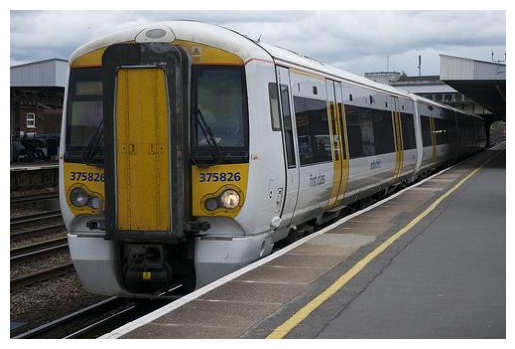

CORRECT :  A white and yellow train is on the tracks. There is a large yellow door on the front of the train. There is a platform next to the train. 
PREDICTED : a train is sitting on the tracks . the train is yellow and black . there is a large white line in the middle of the train . the train is red and black . the train cars are on the left side of the train . the train


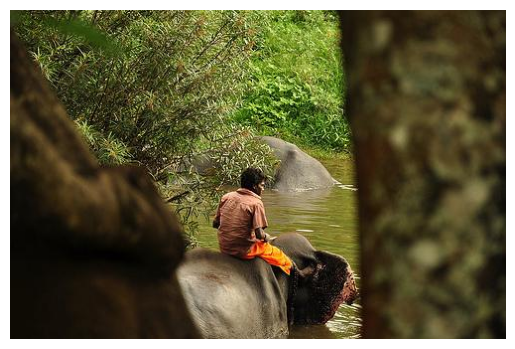

CORRECT :  A man is sitting on the back of an elephant. They are walking through a very high swamp area. They are being seen from in between the perspective of two logs of a tree.
PREDICTED : a man is standing on a beach . he is wearing a short sleeve shirt , shorts and sunglasses . he is holding a white and black bat in his hand . a green ball is soaring in the air towards the man . there are a few suitcases


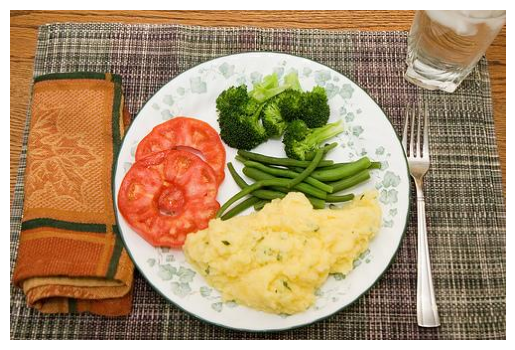

CORRECT :  There is a black place mat on top of a wood table. There is a white plate on the mat with food on it. There is a fork on the mat next to the plate. There is an orange towel next to the plate. 
PREDICTED : a white plate sits on a table . there are crumbs on the plate . there is a small white plate on the table . there are two glasses on the table . the plates have food on top of them . <EOS>


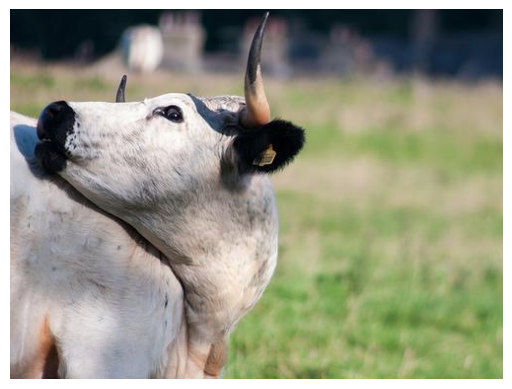

CORRECT :  A goat has its head turned back and it's looking at something. The goat is white but has a black nose and mouth and black ears. The horns of the goat are pointed upwards and has black tops. The goat is standing in green grass.
PREDICTED : a white polar bear is underwater . the bear has huge paws that are tucked together up up to his paws . the eyes are squinted . his ears are sticking up the mouth of his head . the eyes are white . his eyes are black . his


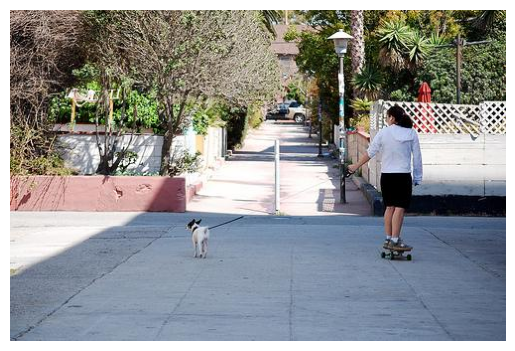

CORRECT :  A woman is walking her dog. She is on a skateboard while she is holding the leash of her dog. She is wearing a gray hoodie and some black shorts.
PREDICTED : a large white building sits behind a street . there is a large white building in front of the building . there is a white building in front of the building . <EOS>


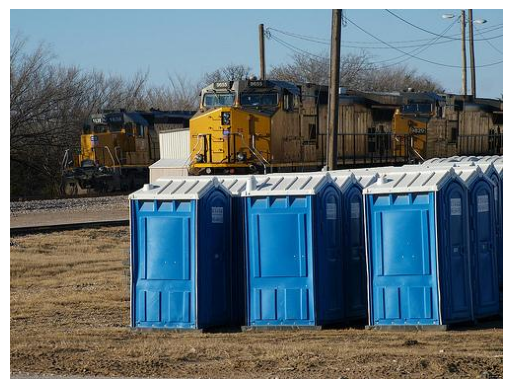

CORRECT :  There are some portable bathrooms sitting near a railroad track. There are some trains sitting on the track. The portable bathrooms are blue with a white roof and the trains are yellow.
PREDICTED : a train is on the train tracks . the train is red in color . the train is yellow and blue . there is a british flag on the front of the train . there is a red light on the side of the train . there is a


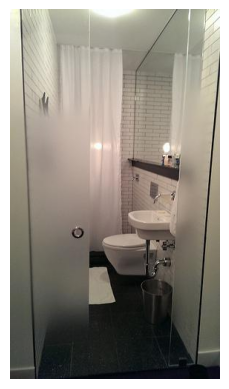

CORRECT :  A very white bathroom has a very white sink and toilet. The shower curtain that hangs from the ceiling is also white. There is one wall that is all mirrored. The door is made of glass and the faucet is silver. The floor is made of black tile. 
PREDICTED : a bathroom with a large illuminated mirror . the toilet is white . there is a white toilet in the corner of the toilet . there is a white sink in the bathroom . there is a mirror on the wall above the sink . there is a mirror


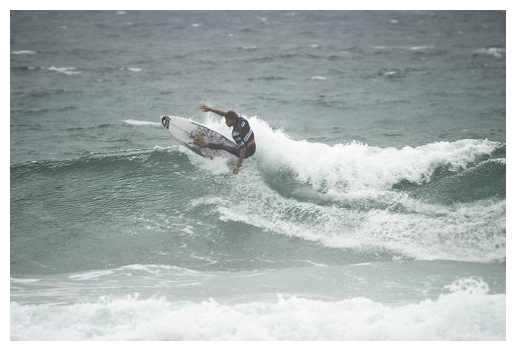

CORRECT :  A man is in a black wetsuit. The man is riding a white surfboard. There is a large wave in the water the man is surfing on. 
PREDICTED : a man is surfing in the ocean water . the man is wearing a wetsuit . the jacket of the man is black . the man is wearing a wetsuit . the wetsuit is black . the man is wearing shorts . the shorts are black with white writing


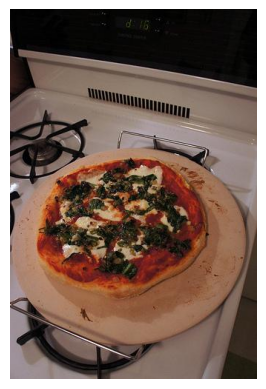

CORRECT :  A pizza is on a brown wooden tray. The tray is placed on the stove top. The pizza has melted cheese and spinach on top of it. The stove is white with black burners.
PREDICTED : a pizza is on a plate . the plate is white . the plate is on a white plate . the plate is on a white table . the table is made of wood . the table is brown . the table is brown . the table is brown


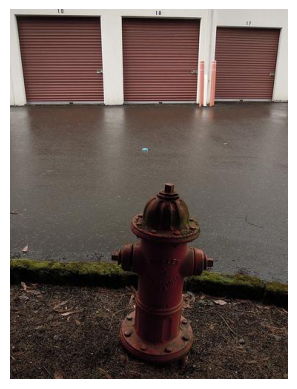

CORRECT :  a flood is occuring. there is a lot of water on the road. the hydrant on the sidewalk is red. the garage doors are red in color . there are some pieces of grass growing.
PREDICTED : a woman is sitting on a bench . the woman is wearing a white shirt and has a red bag on her shoulder . there is a white building behind the woman . there are trees behind the woman . <EOS>


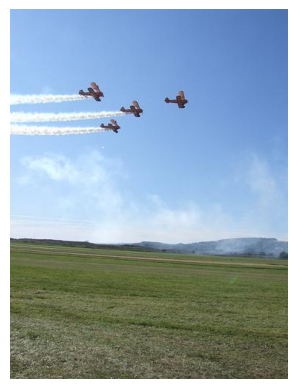

CORRECT :  there are four airplanes in the sky. There is a small hill under them. There is a field of grass under the airplanes. There are smoke trails coming out from behind the airplanes. 
PREDICTED : a man in a white and black jacket and white pants is seen jumping on a train . there are two people behind him standing on the sidewalk . there are large buildings behind the motorcycles . there are tall buildings behind the man . <EOS>


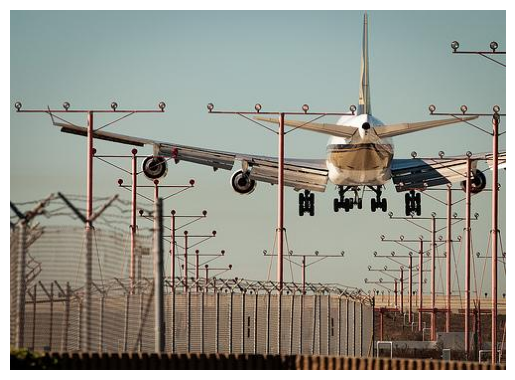

CORRECT :  There is a large white airplane that is in the sky. There is a silver fence under the airplane. There are light poles on both sides of a fence under the plane. 
PREDICTED : a plane is taking off . the plane is white with a blue tail . the sky is very cloudy and mostly blue . the tail of the plane has a gray tail on it . <EOS>


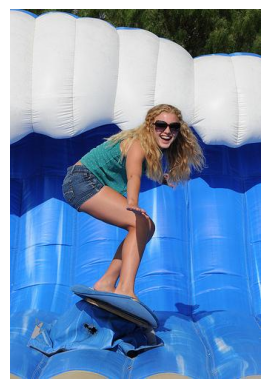

CORRECT :  A young lady is having a very fun time by herself. This young lady has on very short jean shorts, a turquoise top and some shades on. She is surfing a fake wave on a plastic board and having so much fun.

PREDICTED : a woman is standing in a room . she is holding a white game controller in her hand . the woman is wearing a white shirt and has a white beard . there are many lights hanging from the ceiling . <EOS>


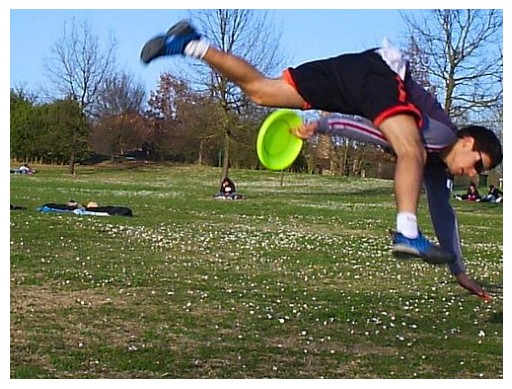

CORRECT :  A man is jumping in the air. The man is holding a green frisbee in his hand. There are trees behind the man. 
PREDICTED : a man is playing tennis on a tennis court . he is wearing a blue and white shirt , black shorts , white socks and black and white shoes . he is holding a racket in his hands . a green tennis ball is soaring towards him . the


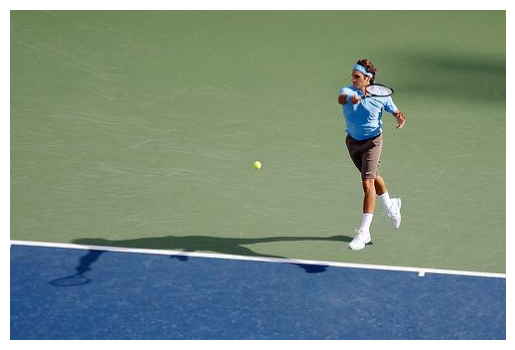

CORRECT :  A tennis player has just forehand swung to hit a ball. The player has on a light blue shirt and headband. He has on brown nike shorts and white shoes.
PREDICTED : a woman is playing tennis on a tennis court . she is wearing a white visor , a white and orange shirt and a white skirt . the woman is holding a racket in her hand . the court is green in color . the court is green and


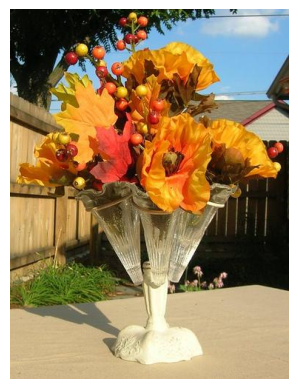

CORRECT :  There is a vase on a table.  The vase has a white enamel base and three flower holders.  In the vase is an assortment of artificial fall colored leaves and berries.  The colors depicted are different shades of orange.  The table appears to be in the backyard of a house.  Behind the vase is a picket fence, a sidewalk, some monkey grass, and some pink flowers.  On the other side of the fence the eaves of the neighboring house are seen. 
PREDICTED : a vase of flowers is on top of a table . the table is wooden and brown . there is a small black and white cat sitting on top of the table . there are two small white fluffy flowers on top of the table . <EOS>


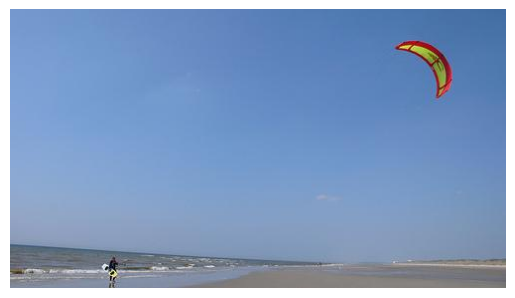

CORRECT :  A person is standing on the beach. They are flying a large yellow and red kite. There are small waves in the water. The person is wearing a black wet suit. 
PREDICTED : a man is skiing down a hill . he is wearing a blue and red jacket , black pants , and a black and red jacket . his cap is black and he has a black helmet on his head . there are trees and behind him is a


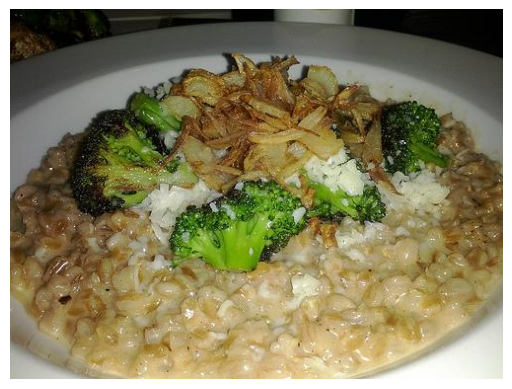

CORRECT :  A white plate of food. There is rice under a pile of broccoli. There are onions cut up on top of the broccoli. 
PREDICTED : a white plate sits on a table . there are crumbs on the plate . there is a small white plate on the table . there are some small cups on the table . <EOS>


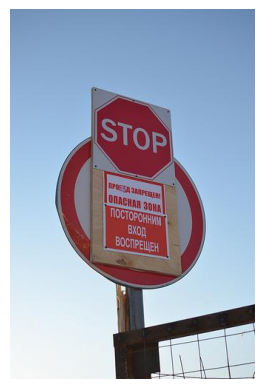

CORRECT :  A stop sign is on a piece of wood and attached to a round sign that is white, with a red border around the outside. Below the stop sign there are two signs in Russian. The signs are attached to a rusty metal fence. 
PREDICTED : a stop sign is red . the sign is a stop sign that is orange with white writing on it . some the sign are red and white . the sky is partly cloudy but mostly blue . the clouds in the sky are wispy and white . <EOS>


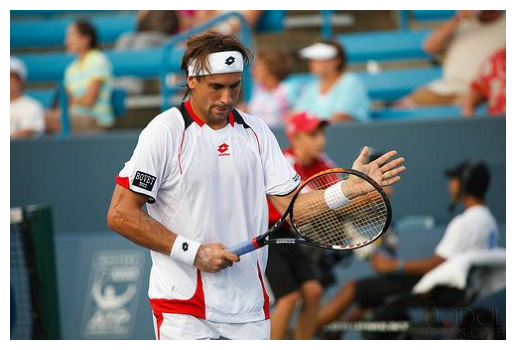

CORRECT :  a man is playing tennis. he is wearing  a sweatband in his hair. his hair is brown in color. his hair is very long. his uniform is white. he is also wearing white shorts.
PREDICTED : a woman is playing tennis on a tennis court . she is wearing a white visor , a white and orange shirt and a white skirt . the woman is holding a racket in her hand . the court is green in color . the court is green and


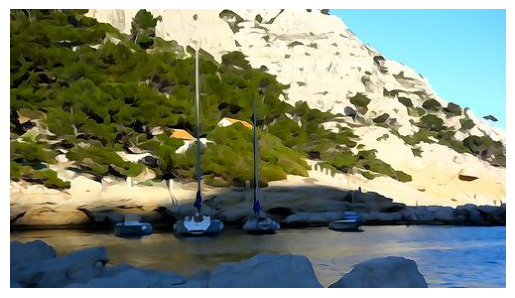

CORRECT :  Four sailboats with masts but no sails are lined up along the shore of a lake.  A hill rises beyond them in the sun.  Part of the hill is bare rock and dirt and part has low green bushes.  The sky is very blue beyond the hill. 
PREDICTED : a man in a black wet suit is holding a white surfboard on a leash . the man is wearing a black wetsuit and has a white surfboard . there are people standing behind the man on the beach . <EOS>


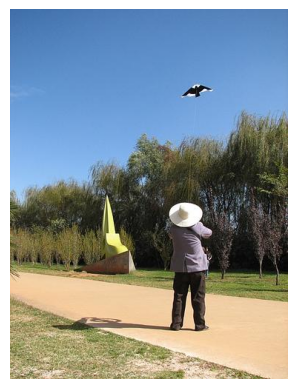

CORRECT :  A man is standing outside flying a black and white kite. He is wearing a white hat on his head, a suit coat, and dark colored pants. A shadow of the man can be seen beside him on the ground. The sky is clear and blue. Tall trees are seen below the sky. 
PREDICTED : a man is standing on a baseball field . he is wearing a short sleeve shirt , shorts and a black and white baseball . the man is holding a black and yellow racket in his hands . a tall chain link fence can be seen behind the man


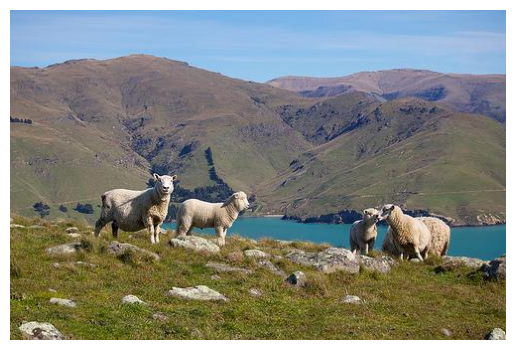

CORRECT :  Five off white sheep are standing on a rocky grassy hill. The stones are medium sized and are grey and white. Beyond the sheep is a bright blue body of water and a set of beautiful grass covered mountains and a blue sky.
PREDICTED : a herd of sheep stand on a hillside . there are no sheep . there are small sheep in the distance . there are many trees and bushes next to the hill . <EOS>


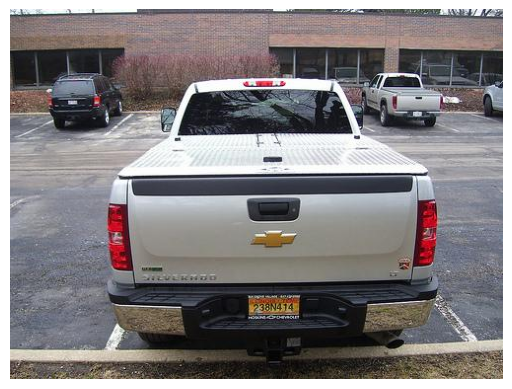

CORRECT :  A large white truck sits in a parking space in a small parking lot. The trailer of the truck has a cover on it. On the other side of the parking lot are a few more cars. The other cars are parked next to a building that looks to be made of brick. There are a few bare plants in the front of the building.
PREDICTED : a truck is transporting a mobile home . the mobile home is tan and has a white stripe down the side . the road is empty with water . the sky is partly cloudy but mostly blue . there are clouds in the sky . <EOS>


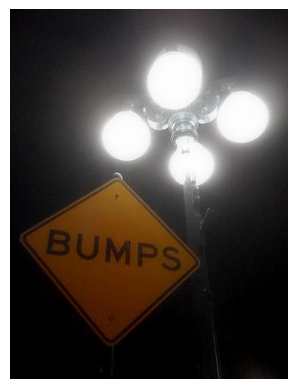

CORRECT :  there is a big yellow sign. the sign is a warning sign. the sign is shaped like a diamond. there is a light above the sign.
PREDICTED : a stop sign is red . the sign is a stop sign that is orange with white writing on it . some the sign are red and white . the sky is partly cloudy but mostly blue . the clouds in the sky are wispy and white . <EOS>


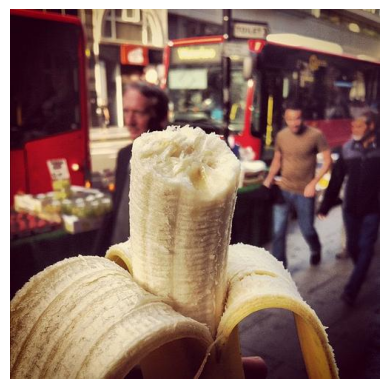

CORRECT :  An image of a peeled large banana dominates the picture. Three men are walking down the street.  The man in the front is by himself while two other men are in close proximity.  Two buses are parked along the side of the street.
PREDICTED : a person is holding a cell phone . the cell phone is black . the person is wearing a black shirt . the person is wearing a red and white dress . <EOS>


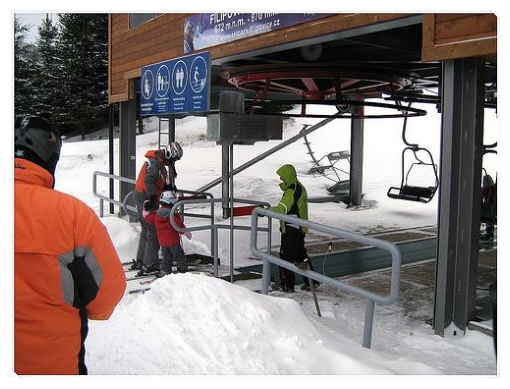

CORRECT :  the scene takes place outdoors in a winter snowy landscape, three persons and a child are interacting. A man is leading a child into the ski lift provider. they are standing by the entrance about to enter, a man in a green jacket seems to the entrance attendant. a building with woodside panelling is above the people. a man is standing in the foreground, wearing an orange jacket. the ground is filled with snow, the people are wearing winter clothes. there are signs above the man and child. 
PREDICTED : a person is skiing down a hill . the person is wearing a black jacket and pants . she is also wearing black pants . the skis have white lines on them . they are both wearing helmets . <EOS>


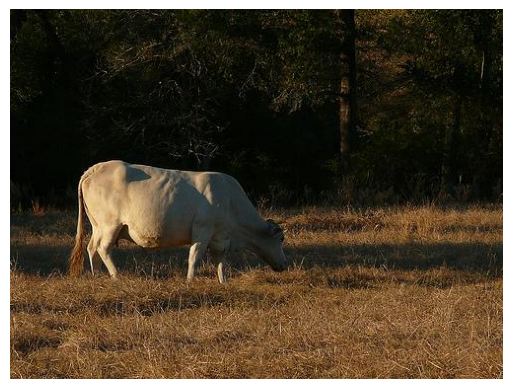

CORRECT :  A large white cow is grazing in the grass. The cow is in a field with weeds and grass. There are trees behind the cow. 
PREDICTED : a large brown cow is running through a muddy puddle on a sunny day . there is a brown and white cow behind the fence . the grass is littered with green leaves . behind the zebra is a fence with a shadow on it . the zebra is


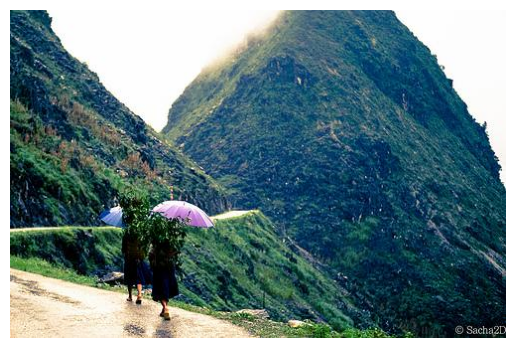

CORRECT :  there is a big mountain. there are a lot of trees on the mountain. there are two girls walking along the trail. the trail is made of dirt. they are holding umbrellas in their hands.
PREDICTED : a man is standing on a beach . he is holding a surfboard . his surfboard is white in color . the man is wearing a black wet suit . <EOS>


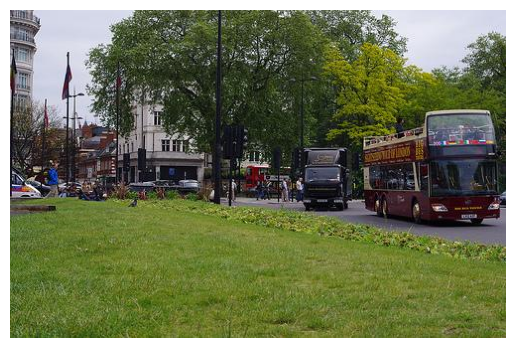

CORRECT :  There is a large strip of grass along a road, with buildings, people, buses, trees and flags. The grass is very green and has something more overgrown like bushes that run along the road. The strip of road that is showing to the right of the picture is black. There are two large buses on the road. One bus is red with yellow words on it and the other is black. There are people in both buses, and along the grass and road. There are large trees running by the roads and buildings in the middle and back of the picture. There are two buildings showing. One building is on a street corner and is white with many stories. The other is to the left and is grey with many stories. There are two flag poles and one of them has a flag hanging on it.
PREDICTED : a bus is driving down the road . the bus is white . there is a bus parked on the sidewalk . the man is wearing a backpack . the bus is white . the man is wearing a jacket . the bus is very big . <EOS>


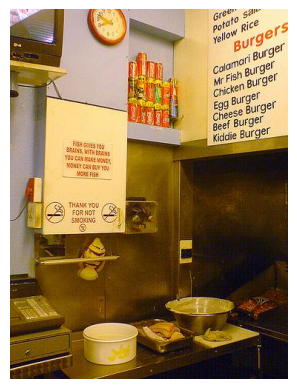

CORRECT :  A menu is see hanging on the wall. The menu is over the kitchen area. There is a range top that has a couple of things on it. On the counter is some fish and chicken. 
PREDICTED : a white counter top has a black oven on it . there is a blue vase above the counter . there is a silver vent above the counter . <EOS>


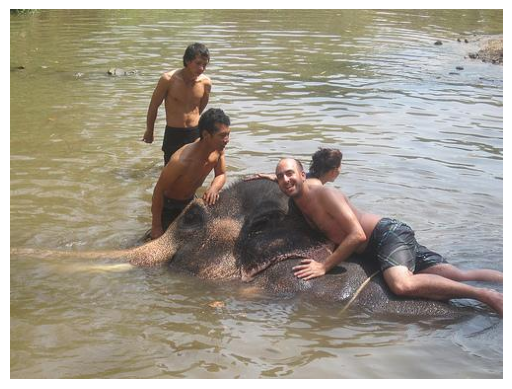

CORRECT :  An elephant relaxes in the water. A man lays on the back of the elephant. A few other men stand around the elephant and look at it. The water is a brown color. The men are all wearing swim trunks. The sun is reflecting on the water.
PREDICTED : a man is surfing a wave . he has on a black hat . his arms are out to the left . he is riding a wave to his left . the waves are coming in the water . <EOS>


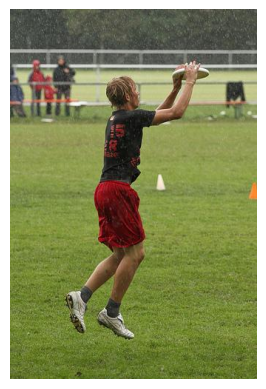

CORRECT :  a boy is playing frisbee. the frisbee is white in color. the shorts are red in color. his shirt is black and red. he is wearing white shoes.
PREDICTED : a man is standing on a baseball field . he is wearing a short sleeve shirt , shorts and a black and white baseball cap . he is holding a black and white baseball bat . the field has green grass , brown dirt and brown dirt on the


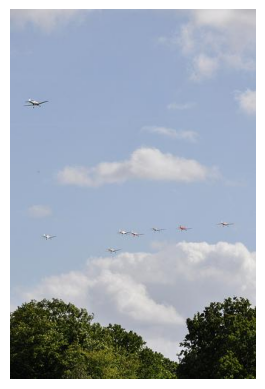

CORRECT :  A bunch of planes are in formation in the air. One plane is way farther away from the rest. The sky is a pretty blue color and a couple of clouds are seen.
PREDICTED : a large white van is parked on a road . there are cars parked in the grass behind the truck . there are trees surrounding the road . <EOS>


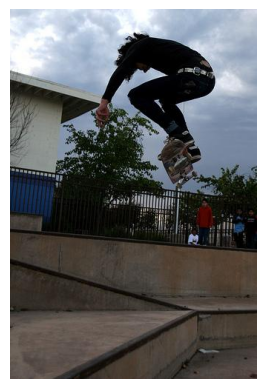

CORRECT :  A person with a black shirt on is jumping on a skateboard. There is a boy in a red jacket standing in front of him. There is a black fence behind the people. 
PREDICTED : a person is wearing a black jacket and pants . they are jumping in the air . the person is wearing a black helmet and goggles . <EOS>


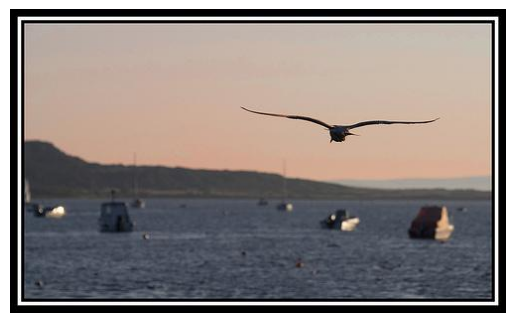

CORRECT :  There are many boats in the water. There are small waves in the water around the boats. There is a bird flying in the air above the water. There is a hill on the other side of the water. 
PREDICTED : a man is surfing in the ocean water . the man is wearing a wetsuit . the jacket of the man is black . the man is wearing a wetsuit . the wetsuit is black . the man is wearing shorts . the shorts are black with white writing


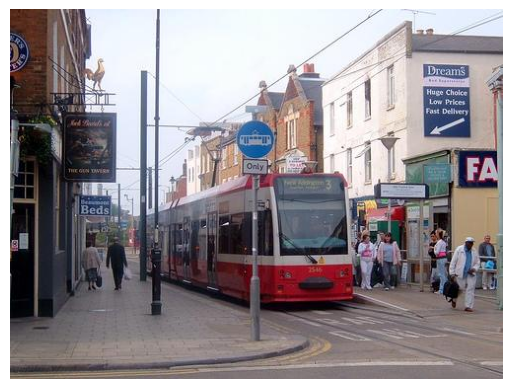

CORRECT :  In this image, a downtown business district in an English speaking country is depicted. The image shows a narrow street with sidewalks on both sides, with customers walking up and down the sidewalks and going in and out of stores. The narrow street does not have any cars driving down it, but instead there is a train or streetcar running on rails. The train is white on the top and red on the bottom with a large glass windshield in front and smaller glass windows on the sides. It is coming up to an intersection. At the intersection, there is a sign that indicates only bicycles are allowed on the cross street. All the people in the picture are wearing lightweight jackets, so it must be fall or spring, as there is no snow or rain. There is a store called Dreams, and a sign advertising beds, though it is difficult to tell if they are beds for sale or rooms for rent. If I had to guess, I'd say this is an English speaking country in Europe. 
PREDICTED : a large white and red train 

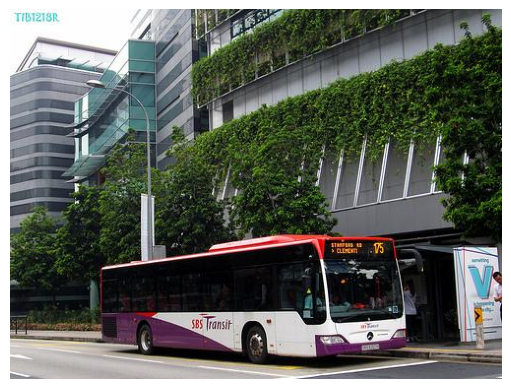

CORRECT :  A bus is on the street. It is currently getting ready to pick some people up and drop some off. The bus is white, purple, and red on the top. The building has a lot of moss on it.
PREDICTED : a bus is driving down a road . the bus is white and has a blue stripe down the side . the bus has a red and white circle with black tires . there are black traffic lights on the side of the bus . there are also people


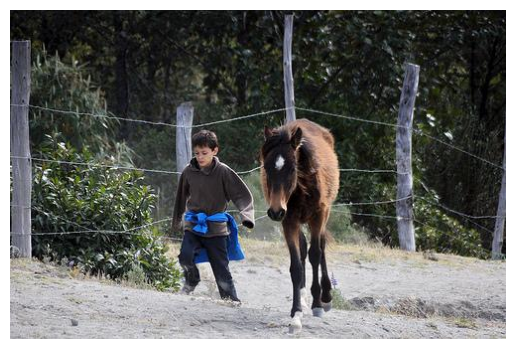

CORRECT :  A young boy is walking with a horse. The young boy has on a black sweater with a blue shirt tied around his waist. The horse is a dark brown color and looks very friendly.
PREDICTED : a large black and white cow is standing in a field . the field has tall grass and weeds in it . there is a fence behind the zebra . there are two cows standing on the ground . <EOS>


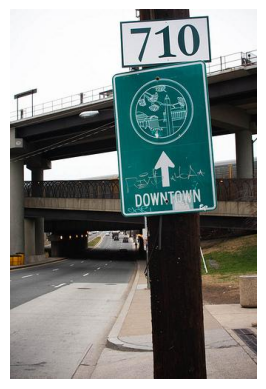

CORRECT :  a sign is on a pole. the pole is green in color. there is an arrow on the sign. the arrow is white in color. there is writing on the sign.
PREDICTED : a stop sign is red . the sign is a stop sign that is orange with white writing on it . some the sign are red and white . the sky is partly cloudy but mostly blue . the clouds in the sky are wispy and white . <EOS>


In [15]:
model.eval()

test_df = pd.read_csv("/kaggle/input/image-captioning/custom_captions_dataset/test.csv")
        
test_imgs = test_df["filename"]
test_captions = test_df["caption"]

generated_captions = []

image_transform = transforms.Compose(
        [
            transforms.Resize((299, 299)),
            transforms.ToTensor(),
            transforms.Normalize((0.485, 0.456, 0.406), (0.229, 0.224, 0.225)),
        ]
    )

for i in range(len(test_imgs)):
    img_id = test_imgs[i]
    image = Image.open(os.path.join("/kaggle/input/image-captioning/custom_captions_dataset/test", img_id)).convert("RGB")

    if(i<50):
        plt.imshow(image)
        plt.axis('off')
        plt.show()

#     print(img_id)
    # Preprocess the image
    image = image_transform(image).unsqueeze(0).to(device)
    
    # Generate caption
    with torch.no_grad():
        model.eval()
        caption = model.captions_image(image, train_dataset.vocab)
    generated_captions.append(" ".join(caption[1:]))
    

    # Convert token IDs to words using Vocabulary
    if(i < 50):
        print("CORRECT : ", test_captions[i])
        print("PREDICTED :", " ".join(caption[1:]))

In [16]:
!pip install https://files.pythonhosted.org/packages/1f/56/a81022436c08b9405a5247b71635394d44fe7e1dbedc4b28c740e09c2840/rouge_score-0.0.4-py2.py3-none-any.whl

In [17]:
from rouge_score import rouge_scorer

reference_captions = test_captions.tolist()
rouge = rouge_scorer.RougeScorer(['rouge1', 'rougeL'], use_stemmer = True)


rougeL_precision = []
rougeL_recall = []
rougeL_f1 = []
for reference, prediction in zip(reference_captions, generated_captions):
    scores = rouge.score(reference, prediction)
    rougeL_scores = scores['rougeL']
    
    rougeL_precision.append(rougeL_scores.precision)
    rougeL_recall.append(rougeL_scores.recall)
    rougeL_f1.append(rougeL_scores.fmeasure)


average_rougeL_precision = sum(rougeL_precision) / len(rougeL_precision)
average_rougeL_recall = sum(rougeL_recall) / len(rougeL_recall)
average_rougeL_f1 = sum(rougeL_f1) / len(rougeL_f1)

print("Average Rouge-L Precision:", average_rougeL_precision)
print("Average Rouge-L Recall:", average_rougeL_recall)
print("Average Rouge-L F1-score:", average_rougeL_f1)

Average Rouge-L Precision: 0.331611980959768
Average Rouge-L Recall: 0.23380320720378248
Average Rouge-L F1-score: 0.26138034767078994


In [18]:
!pip install pycocoevalcap
!pip install nltk

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 104.3/104.3 MB 15.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 426.2/426.2 kB 21.5 MB/s eta 0:00:00


In [19]:
from pycocoevalcap.cider.cider import Cider
from pycocoevalcap.spice.spice import Spice

def evaluate(model):
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    
    
    # Initialize evaluation metrics
    cider_scorer = Cider()
    spice_scorer = Spice()
    
    # Switch to evaluation mode
    model.eval()
    
    references = {}
    hypotheses = {}
    
    with torch.no_grad():
        for i in range(len(test_imgs)):
            img_id = test_imgs[i]
            
            if img_id not in references:
                references[img_id] = []
                hypotheses[img_id] = []
            references[img_id].append(test_captions[i])
            hypotheses[img_id].append(generated_captions[i])

    
    # Compute evaluation scores
    cider_score, _ = cider_scorer.compute_score(references, hypotheses)
    spice_score, _ = spice_scorer.compute_score(references, hypotheses)
    
    return cider_score, spice_score

cider_score, spice_score = evaluate(model)
print("CIDEr Score:", cider_score)
print("SPICE Score:", spice_score)


Progress: 384.5M / 384.5M (100.0%)
Extracting stanford-corenlp-3.6.0 ...
Done.


Parsing reference captions
Initiating Stanford parsing pipeline
[main] INFO edu.stanford.nlp.pipeline.StanfordCoreNLP - Adding annotator tokenize
[main] INFO edu.stanford.nlp.pipeline.TokenizerAnnotator - TokenizerAnnotator: No tokenizer type provided. Defaulting to PTBTokenizer.
[main] INFO edu.stanford.nlp.pipeline.StanfordCoreNLP - Adding annotator ssplit
[main] INFO edu.stanford.nlp.pipeline.StanfordCoreNLP - Adding annotator parse
[main] INFO edu.stanford.nlp.parser.common.ParserGrammar - Loading parser from serialized file edu/stanford/nlp/models/lexparser/englishPCFG.ser.gz ... 
done [0.7 sec].
[main] INFO edu.stanford.nlp.pipeline.StanfordCoreNLP - Adding annotator lemma
[main] INFO edu.stanford.nlp.pipeline.StanfordCoreNLP - Adding annotator ner
Loading classifier from edu/stanford/nlp/models/ner/english.all.3class.distsim.crf.ser.gz ... done [1.3 sec].
Loading classifier from edu/stanford/nlp/models/ner/english.muc.7class.distsim.crf.ser.gz ... done [0.7 sec].
Loading classif

SPICE evaluation took: 3.550 min
CIDEr Score: 0.03951025476649118
SPICE Score: 0.09861253988760205
